<a href="https://colab.research.google.com/github/Dhruv-Sharma01/CS399-Real-Time-Drone-Data-Analysis/blob/main/Object_Detection_YOLO.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!git clone https://github.com/ultralytics/yolov5  # Clone the YOLOv5 repository
%cd yolov5
!pip install -r requirements.txt  # Install the necessary dependencies


Cloning into 'yolov5'...
remote: Enumerating objects: 16927, done.
remote: Counting objects: 100% (122/122), done.
remote: Compressing objects: 100% (74/74), done.
remote: Total 16927 (delta 62), reused 87 (delta 48), pack-reused 16805 (from 1)
Receiving objects: 100% (16927/16927), 15.68 MiB | 15.73 MiB/s, done.
Resolving deltas: 100% (11600/11600), done.
/content/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.8/41.8 kB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 38.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 872.2/872.2 kB 29.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 2.9 MB/s eta 0:00:00
  Attempting uninstall: pillow
    Found existing installation: Pillow 9.4.0
    Uninstalling Pillow-9.4.0:
      Successfully uninstalled Pillow-9.4.0


In [ ]:
!curl -L "https://github.com/ultralytics/yolov5/releases/download/v1.0/coco128.zip" -o coco128.zip
!unzip coco128.zip -d /content/


  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100 6819k  100 6819k    0     0  8380k      0 --:--:-- --:--:-- --:--:-- 8380k
Archive:  coco128.zip
   creating: /content/coco128/
  inflating: /content/coco128/LICENSE  
   creating: /content/coco128/images/
   creating: /content/coco128/images/train2017/
  inflating: /content/coco128/images/train2017/000000000612.jpg  
  inflating: /content/coco128/images/train2017/000000000404.jpg  
  inflating: /content/coco128/images/train2017/000000000438.jpg  
  inflating: /content/coco128/images/train2017/000000000389.jpg  
  inflating: /content/coco128/images/train2017/000000000564.jpg  
  inflating: /content/coco128/images/train2017/000000000149.jpg  
  inflating: /content/coco128/images/train2017/000000000605.jpg  
  inflating: /content/coco128/images/train2

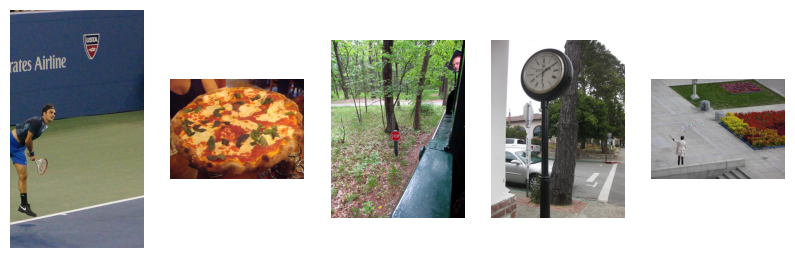

In [ ]:
import matplotlib.pyplot as plt
import cv2
import glob

# Display a few images from the dataset
image_paths = glob.glob('/content/coco128/images/train2017/*.jpg')[:5]
plt.figure(figsize=(10, 10))
for i, img_path in enumerate(image_paths):
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.subplot(1, 5, i+1)
    plt.imshow(img)
    plt.axis('off')
plt.show()


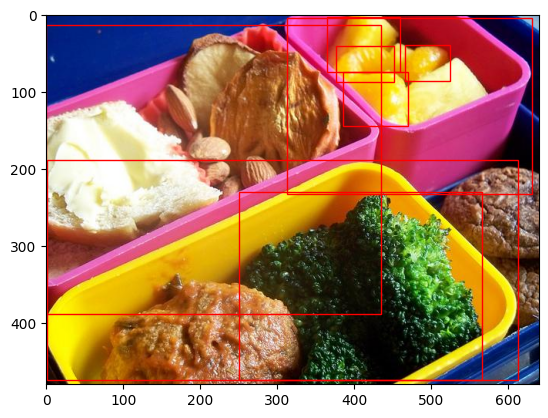

In [ ]:
import matplotlib.patches as patches

def show_image_with_boxes(image_path, label_path):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    fig, ax = plt.subplots(1)
    ax.imshow(img)

    # Read the label file
    with open(label_path, 'r') as file:
        labels = file.readlines()

    # Draw bounding boxes
    for label in labels:
        label = label.split()
        x_center, y_center, width, height = [float(i) for i in label[1:]]
        x = x_center - width / 2
        y = y_center - height / 2
        rect = patches.Rectangle((x * img.shape[1], y * img.shape[0]), width * img.shape[1], height * img.shape[0], linewidth=1, edgecolor='r', facecolor='none')
        ax.add_patch(rect)

    plt.show()

# Display an example image with bounding boxes
show_image_with_boxes('/content/coco128/images/train2017/000000000009.jpg', '/content/coco128/labels/train2017/000000000009.txt')


In [ ]:
data_yaml = """
train: /content/coco128/images/train2017/
val: /content/coco128/images/train2017/

nc: 80  # Number of classes in COCO
names: ['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light', 'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple', 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed', 'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote', 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors', 'teddy bear', 'hair drier', 'toothbrush']
"""
with open('/content/yolov5/data/coco128.yaml', 'w') as f:
    f.write(data_yaml)

In [ ]:
%cd /content/yolov5
!python train.py --img 640 --batch 8 --epochs 3 --data /content/yolov5/data/coco128.yaml --weights yolov5s.pt

/content/yolov5
2024-08-30 17:11:38.551671: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-08-30 17:11:38.666166: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-08-30 17:11:38.685990: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=, data=/content/yolov5/data/coco128.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=3, batch_size=8, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=None, image_weights=False, device=, mult

In [ ]:
!ls /content/yolov5/runs/train/exp/

confusion_matrix.png				    PR_curve.png	   val_batch0_pred.jpg
events.out.tfevents.1725037904.1f5f31ae32fa.1097.0  R_curve.png		   val_batch1_labels.jpg
F1_curve.png					    results.csv		   val_batch1_pred.jpg
hyp.yaml					    results.png		   val_batch2_labels.jpg
labels_correlogram.jpg				    train_batch0.jpg	   val_batch2_pred.jpg
labels.jpg					    train_batch1.jpg	   weights
opt.yaml					    train_batch2.jpg
P_curve.png					    val_batch0_labels.jpg


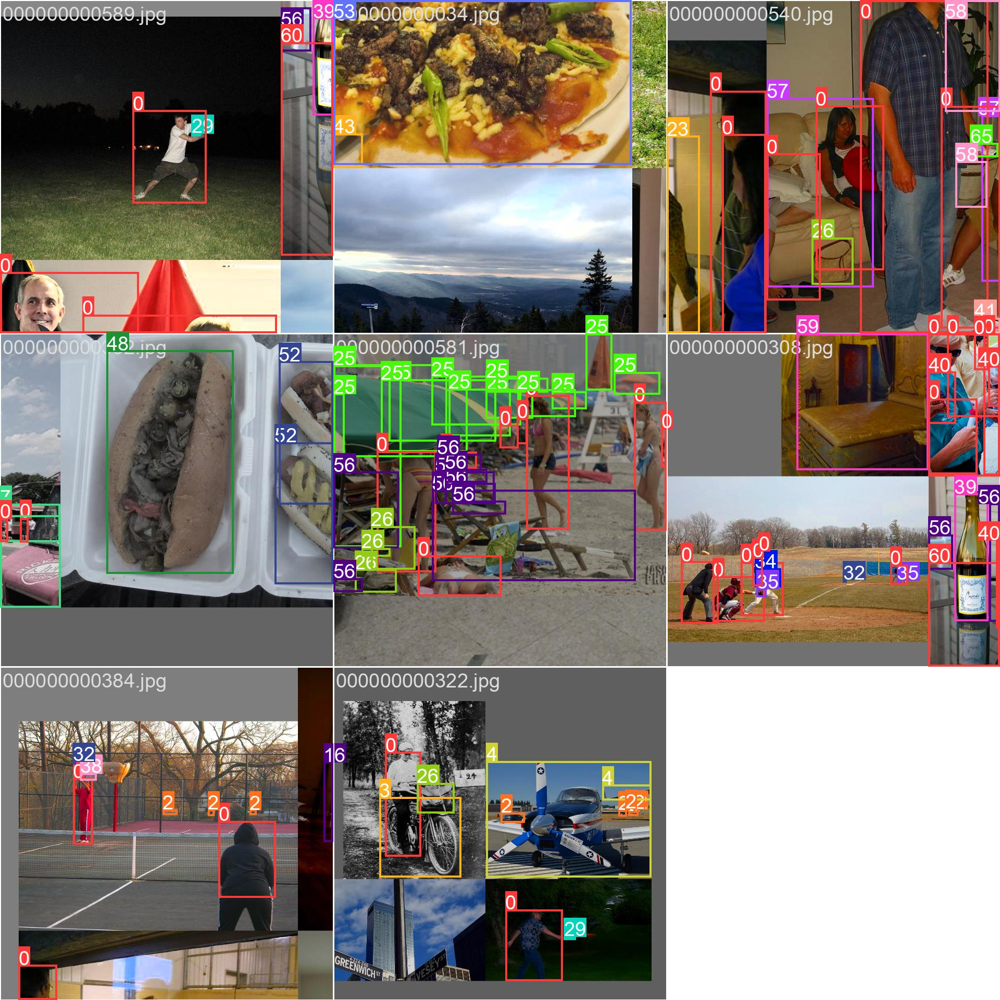

In [ ]:
from IPython.display import Image, display

# Display an example image from training progress
display(Image(filename='/content/yolov5/runs/train/exp/train_batch0.jpg'))  # Adjust path if necessary


In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/yolov5/runs/train/


<IPython.core.display.Javascript object>

detect: weights=['runs/train/exp/weights/best.pt'], source=data/images/bus.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-362-ge8a30cf8 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/1 /content/yolov5/data/images/bus.jpg: 640x480 4 persons, 1 bus, 29.0ms
Speed: 0.6ms pre-process, 29.0ms inference, 573.9ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp


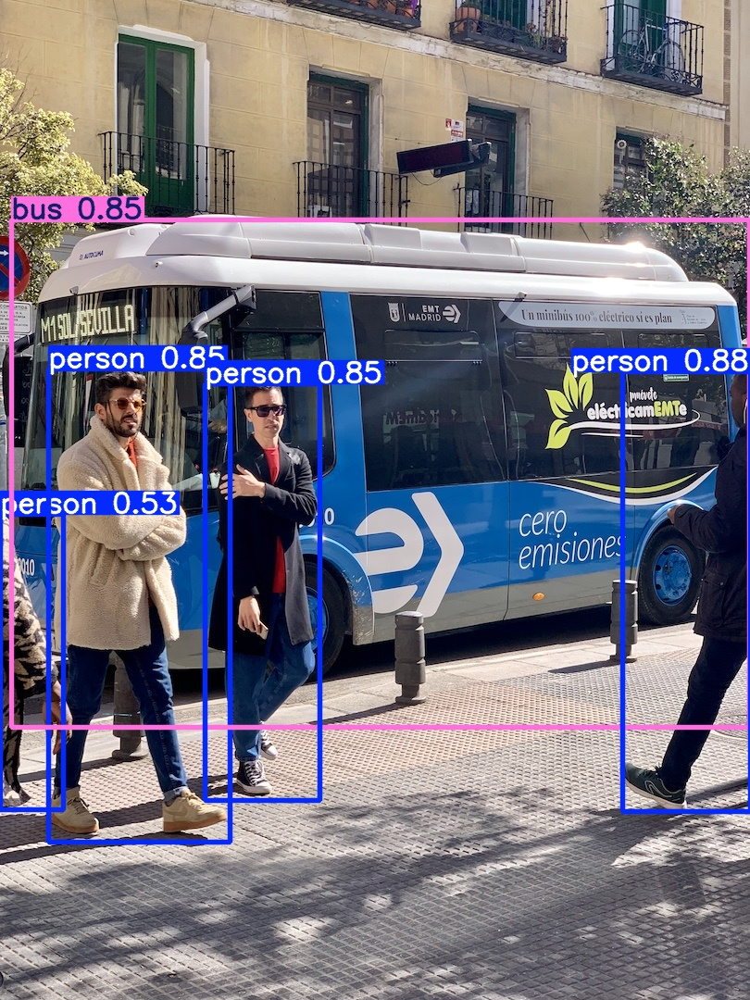

In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 640 --conf 0.25 --source data/images/bus.jpg

# Display the detection result
display(Image(filename='/content/yolov5/runs/detect/exp/bus.jpg'))


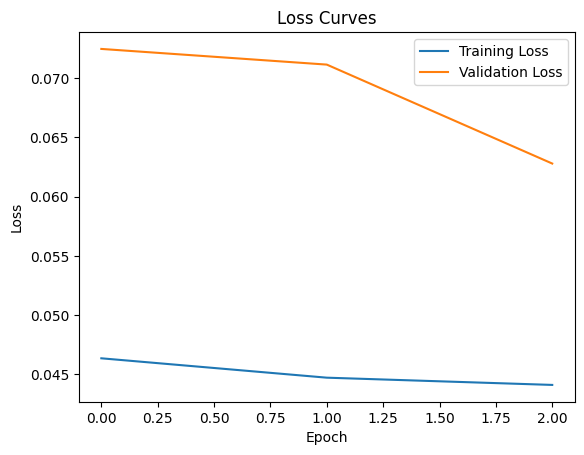

In [ ]:
import numpy as np

# Load training results
results = np.loadtxt('runs/train/exp/results.csv', delimiter=',', skiprows=1)

# Plot training and validation loss
plt.plot(results[:, 0], results[:, 1], label='Training Loss')
plt.plot(results[:, 0], results[:, 2], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss Curves')
plt.legend()
plt.show()


Implementing it on Video

In [ ]:
!pip install opencv-python
!pip install torch torchvision


In [ ]:
import torch

# Load the YOLOv5s model
model = torch.hub.load('ultralytics/yolov5', 'yolov5s')  # or load a local model


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-8-30 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


In [ ]:
import warnings
warnings.filterwarnings('ignore')

In [ ]:
# the problem with current approach is we are going frame by frame which slows the process, also doesn't give the access to previous memory of the video/frames passed through.
# also using the previous developed library, it is very generic and can take high time to process, making it not suitable for the drone GPU/CPU

In [27]:
from google.colab.patches import cv2_imshow  # Import the Colab-specific function
import torch
import cv2
from IPython.display import Image as IPImage, display

def process_and_save_image(input_image_path, output_image_path, model_name='yolov5s', scale=0.5):
    """
    Downscale, process, and save the image using YOLOv5 model.

    Args:
        input_image_path (str): Path to the input image file.
        output_image_path (str): Path to save the processed image.
        model_name (str): Name of the YOLO model to use ('yolov5s', 'yolov5m', etc.).
        scale (float): Factor to downscale the image (e.g., 0.5 to reduce size by half).
    """
    # Load the YOLO model
    model = torch.hub.load('ultralytics/yolov5', model_name)

    # Read the image
    img = cv2.imread(input_image_path)

    # Check if the image was loaded successfully
    if img is None:
        raise ValueError(f"Failed to load image. Please check the path: {input_image_path}")

    # Get original image dimensions and calculate new dimensions
    height, width, channels = img.shape[:3]  # Include the third value for channels
    new_width = int(width * scale)
    new_height = int(height * scale)

    # Downscale the image
    img = cv2.resize(img, (new_width, new_height))

    # Perform inference on the downscaled image
    results = model(img)

    # Render the detections on the image
    result_img = results.render()[0]  # render() returns a list, we take the first image

    # Save the processed image
    cv2.imwrite(output_image_path, result_img)

    # Display the processed image in the notebook
    display_image(output_image_path)

def display_image(image_path):
    """
    Display the image in the Jupyter notebook.

    Args:
        image_path (str): Path to the image file to display.
    """
    # Display the image using IPython's display capabilities
    display(IPImage(filename=image_path))

# # Example usage:
# input_image_path = '/content/input_image.jpg'
# output_image_path = '/content/output_image.jpg'

# # Process, downscale, and save the image
# process_and_save_image(input_image_path, output_image_path, scale=0.5)

# # Display the processed image
# display_image(output_image_path)


In [ ]:
from google.colab.patches import cv2_imshow  # Import the Colab-specific function
import torch
import cv2
from IPython.display import HTML
from base64 import b64encode

def process_and_save_video(input_video_path, output_video_path, model_name='yolov5s', scale=0.5):
    """
    Downscale, process, and save the video using YOLOv5 model.

    Args:
        input_video_path (str): Path to the input video file.
        output_video_path (str): Path to save the processed video.
        model_name (str): Name of the YOLO model to use ('yolov5s', 'yolov5m', etc.).
        scale (float): Factor to downscale the video (e.g., 0.5 to reduce size by half).
    """
    # Load the YOLO model
    model = torch.hub.load('ultralytics/yolov5', 'yolov5s')

    # Capture the input video
    cap = cv2.VideoCapture(input_video_path)

    # Get original video dimensions and calculate new dimensions
    frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    new_width = int(frame_width * scale)
    new_height = int(frame_height * scale)
    fps = cap.get(cv2.CAP_PROP_FPS)

    # Output video writer setup with the new dimensions
    out = cv2.VideoWriter(output_video_path, cv2.VideoWriter_fourcc(*'mp4v'), fps, (new_width, new_height))

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        # Downscale the frame
        frame = cv2.resize(frame, (new_width, new_height))

        # Perform inference on the downscaled frame
        results = model(frame)

        # Render the detections on the frame
        result_frame = results.render()[0]  # render() returns a list, we take the first frame

        # Write the frame to the output video
        out.write(result_frame)

        # Optionally, display the frame using cv2_imshow
        # cv2_imshow(result_frame)

        if cv2.waitKey(1) & 0xFF == ord('q'):
            break

    # Release the video capture and writer objects
    cap.release()
    out.release()
    cv2.destroyAllWindows()

    # Display the video in the notebook
    display_video(output_video_path)

def display_video(video_path):
    """
    Display the video in the Jupyter notebook.

    Args:
        video_path (str): Path to the video file to display.
    """
    mp4 = open(video_path, 'rb').read()
    data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

    # Display video in HTML format
    return HTML(f"""
    <video width=400 controls>
          <source src="{data_url}" type="video/mp4">
    </video>
    """)


In [ ]:

# Example usage:
input_video_path = '/content/input_video_crash.mp4'
output_video_path = '/content/output_video_crash.mp4'

# Process, downscale, and save the video
process_and_save_video(input_video_path, output_video_path, scale=0.5)

# Display the processed video
display_video(output_video_path)

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-8-30 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-8-30 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


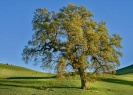

In [32]:
# Example usage:
input_image_path = '/content/tree.jpg'
output_image_path = '/content/tree_output.jpg'

# Process, downscale, and save the video
process_and_save_image(input_image_path, output_image_path, scale=0.5)

# Display the processed video
# display_video(output_image_path)